# Simple Mapping with Folium

[Folium](https://python-visualization.github.io/folium/) is a high-level mapping that builds on the `leaflet.js` library and makes mapping in Python a doddle.

This notebook uses postcode files from [Open Door Logistics](https://www.opendoorlogistics.com/) - see `./postcode-data/license.txt` and `./postcode-data/os-opendata-license.pdf` parsed using the `shapefile` library




In [1]:
import folium
import pandas as pd
import shapefile
import os
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_blobs
from folium.plugins import HeatMap

## Plot a Simple Map

In [2]:
# Plot a map centred on the UK with 1000KM recd circle just for fun

In [3]:
m = folium.Map(Location=[51.5074, -1.1278], zoom_start=6, tiles="Stamen Toner")
folium.Circle([51.5074, -1.1278], 1000000, color="#FF0000").add_to(m)
m

## Plot a HeatMap



In [4]:
X = make_blobs(n_samples=100, n_features=2, centers=None, cluster_std=0.5, center_box=[-4.0, 4.0])

### Visualise the Random Blobs using MatPlotLib

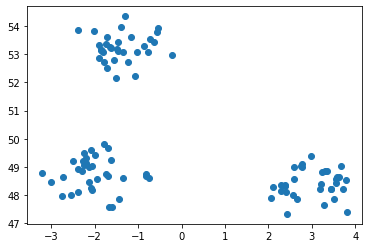

In [5]:
heatmap_df = pd.DataFrame({"longitude": X[0][:,0], "latitude": X[0][:, 1] + 51.5074})

plt.scatter(heatmap_df["longitude"], heatmap_df["latitude"])

In [6]:
m = folium.Map(Location=[51.5074, -1.1278], zoom_start=6, tiles="Stamen Toner")

HeatMap(heatmap_df[["latitude", "longitude"]].values, radius=10).add_to(m)

m

## Plot Choropleths

In [7]:
# Get the shapefile records (Open Door Logistics)
area_shapes = shapefile.Reader(os.path.join(".", "postcode-data", "Areas.shp"))
area_SR = area_shapes.shapeRecords()

In [8]:
# Make Fake Data using Numpy

postcode_area_data = []
for sr in area_SR:
    postcode_area_data.append({"postcode_area": sr.record[0],
                                   "postcode_area_value": np.random.randint(100)})
postcode_df = pd.DataFrame.from_dict(postcode_area_data)
postcode_df.head()

,postcode_area,postcode_area_value
0,AB,19
1,AL,75
2,B,80
3,BA,88
4,BB,30


In [9]:
m = folium.Map(Location=[51.5074, -1.1278], zoom_start=6, tiles="stamentoner")

tiles = ["stamenwatercolor", "cartodbpositron", "openstreetmap", "stamenterrain", "stamentoner"]

for tile in tiles:
    folium.TileLayer().add_to(m)

folium.Choropleth(
    geo_data=area_SR,
    data=postcode_df,
    columns=["postcode_area", "postcode_area_value"],
    key_on="feature.properties.name",
    fill_color="OrRd",
    fill_opacity=0.7,
    line_opacity=0.4,
    smooth_factor=0
).add_to(m)
    
folium.LayerControl().add_to(m)

m

See the Folium Docs for more info:

[https://python-visualization.github.io/folium/](https://python-visualization.github.io/folium/)